# Explore here

It's recommended to use this notebook for exploration purposes.

For example: 

1. You could import the CSV generated by python into your notebook and explore it.
2. You could connect to your database using `pandas.read_sql` from this notebook and explore it.

In [9]:
pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [11]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [18]:
pip install folium

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.0/95.0 kB 5.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [15]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


**EDA y limpieza de datos**

##### Vamos a leer los datos y hacer una exploración preliminar. Para hacer esto debemos bajar algunas librerias necesarias para el trabajo.

In [19]:
# importamos las librerias 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#from datautils.analysis import *
import plotly.express as px
import matplotlib.image as mpimg
%matplotlib inline
import folium
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium.plugins import HeatMap
import warnings


In [23]:
#Leer los datos: 
# df_airbnb = pd.read_csv('../data/raw/AB_NYC_2019.csv') # los guarde dentro del gitpod
# df_airbnb = pd.read_csv('C:\\Users\\Administrador\\Desktop\\Curso UTEC\\14_clase 22_06_22\\AB_NYC_2019.csv')# los guardo dentro de mi computadora
df_airbnb = pd.read_csv("https://raw.githubusercontent.com/4GeeksAcademy/data-preprocessing-project-tutorial/main/AB_NYC_2019.csv")

In [24]:
# hacer un sample:
df_airbnb.sample(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
34800,27584915,CLEAN PRIVATE bathroom in Newly built in 2014,204704622,Momoyo,Queens,Elmhurst,40.73874,-73.87615,Private room,59,29,0,NaN,NaN,7,41
35409,28089652,Boho-Chic sleeps 4 TOP FLOOR penthouse prime W...,23156390,Emily,Brooklyn,Williamsburg,40.71227,-73.95700,Entire home/apt,122,30,5,2019-07-02,0.76,1,152
16788,13399051,"Modern Apartment LES, 2mn to train",4027689,Miguel,Manhattan,Lower East Side,40.71518,-73.98953,Private room,150,3,12,2017-10-30,0.32,2,0
16499,13231183,East 60th Street~Perfect Studio for 2,2856748,Ruchi,Manhattan,Upper East Side,40.76161,-73.96192,Entire home/apt,138,30,0,NaN,NaN,49,365
37253,29605492,Gilchrist Private,222843411,Brian,Brooklyn,Brooklyn Heights,40.69615,-73.99682,Entire home/apt,1000,3,0,NaN,NaN,1,363


In [25]:
# averiguando que columnas tienen valores nulos:
# usar la función 'suma' nos mostrará cuántos nulos se encuentran en cada columna en el conjunto de datos
df_airbnb.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

##### En nuestro caso, los datos faltantes que se observan no necesitan demasiado tratamiento especial. Al observar la naturaleza de nuestro conjunto de datos, podemos establecer más cosas: las columnas "name" y "host_name" son irrelevantes e insignificantes para nuestro análisis de datos, las columnas "last_review" y "reviews_per_months" necesitan un manejo muy simple. 

In [26]:
# información del dataset:
# ver variables y muestra de contenidos
df_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

##### Despues de cargar los datos podemos observar que en las 16 columnas brindan una gran cantidad de información para la exploración profunda de datos. Ya vemos algunos valores faltantes, que requerirán limpieza y manejo de estos valores. 

##### dentro del dataset tenemos 48.895 observaciones y 16 variables, de las cuales en 4 encontramos valores nulos.
##### tambien se observa que tenemos 3 variables de tipo float64, 7 de tipo int64 y 6 de tipo object.

In [27]:
# cambiar algunas variables de formato:
df_airbnb=df_airbnb.astype({'name':'str','host_name':'str','neighbourhood_group':'category','neighbourhood':'category','room_type':'category'})
df_airbnb['last_review'] = pd.to_datetime(df_airbnb['last_review'], format="%Y/%m/%d")
df_airbnb.dtypes

id                                         int64
name                                      object
host_id                                    int64
host_name                                 object
neighbourhood_group                     category
neighbourhood                           category
latitude                                 float64
longitude                                float64
room_type                               category
price                                      int64
minimum_nights                             int64
number_of_reviews                          int64
last_review                       datetime64[ns]
reviews_per_month                        float64
calculated_host_listings_count             int64
availability_365                           int64
dtype: object

In [28]:
# vemos alguna información del dataset:
round(df_airbnb.describe()) 

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.0,48895.0,48895.0,48895.0,48895.0,48895.0,48895.0,38843.0,48895.0,48895.0
mean,19017143.0,67620011.0,41.0,-74.0,153.0,7.0,23.0,1.0,7.0,113.0
std,10983108.0,78610967.0,0.0,0.0,240.0,21.0,45.0,2.0,33.0,132.0
min,2539.0,2438.0,40.0,-74.0,0.0,1.0,0.0,0.0,1.0,0.0
25%,9471945.0,7822033.0,41.0,-74.0,69.0,1.0,1.0,0.0,1.0,0.0
50%,19677284.0,30793816.0,41.0,-74.0,106.0,3.0,5.0,1.0,1.0,45.0
75%,29152178.0,107434423.0,41.0,-74.0,175.0,5.0,24.0,2.0,2.0,227.0
max,36487245.0,274321313.0,41.0,-74.0,10000.0,1250.0,629.0,58.0,327.0,365.0


##### Me tira un poco de datos como por ejemplo el precio promedio es de 153 USD, además vemos un precio maximo por día muy elevado (10000). Quizas este dato puede ser manejado como outliers.
#### Los valores máximos y mínimos de latitud y longitud son correctos para la Ciudad de Nueva York. 
#### Es razonable que el mínimo de noches sea 1, pero un maximo de 1250 noches no parece ser correcto.
#### calculated_host_listings_count corresponde a la cantidad de alojamientos que tiene un mismo host. Los valores más comunes son 1 y 2, el máximo es 327.


**Ubicación de los alojamientos**

In [29]:
Long = -73.95
Lat = 40.73
locations = list(zip(df_airbnb.latitude, df_airbnb.longitude))

map1 = folium.Map(location=[Lat,Long], zoom_start=10)
FastMarkerCluster(data=locations).add_to(map1)
map1

In [30]:
# describimos algunas variables:
df_airbnb.describe(include=['object','category','datetime64'])

/tmp/ipykernel_1502/906962212.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df_airbnb.describe(include=['object','category','datetime64'])


,name,host_name,neighbourhood_group,neighbourhood,room_type,last_review
count,48895,48895,48895,48895,48895,38843
unique,47906,11453,5,221,3,1764
top,Hillside Hotel,Michael,Manhattan,Williamsburg,Entire home/apt,2019-06-23 00:00:00
freq,18,417,21661,3920,25409,1413
first,NaN,NaN,NaN,NaN,NaN,2011-03-28 00:00:00
last,NaN,NaN,NaN,NaN,NaN,2019-07-08 00:00:00


In [31]:
#encontrar los host que se llaman Michael.
df_airbnb[df_airbnb['host_name']=='Michael']

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
151,36121,Lg Rm in Historic Prospect Heights,62165,Michael,Brooklyn,Prospect Heights,40.67386,-73.96641,Private room,85,15,9,2013-05-10,0.09,1,339
412,138216,Sunny and Spacious Designer's Home,674970,Michael,Brooklyn,Greenpoint,40.72212,-73.94254,Entire home/apt,141,5,8,2018-07-08,0.21,1,9
519,189135,Hell's Kitchen Funky 80's Hideaway!,179020,Michael,Manhattan,Hell's Kitchen,40.76311,-73.99388,Private room,99,1,89,2019-07-01,1.00,1,353
616,233189,NYC Studio in Heart of Times Square,1220414,Michael,Manhattan,Hell's Kitchen,40.76166,-73.99675,Entire home/apt,179,30,83,2019-05-31,0.88,1,292
811,289037,"2BR in Cobble Hill, Brooklyn, NY",632334,Michael,Brooklyn,Carroll Gardens,40.68353,-73.99140,Entire home/apt,189,2,13,2016-09-05,0.18,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48378,36228909,Sunny SoHo Penthouse w/ Pvt. Terrace!,272485928,Michael,Manhattan,SoHo,40.72336,-74.00465,Entire home/apt,600,3,0,NaT,NaN,1,179
48531,36310247,Spacious 1 Bedroom With Private Garden,25498509,Michael,Brooklyn,Clinton Hill,40.68183,-73.96464,Entire home/apt,100,1,0,NaT,NaN,1,6
48786,36426788,Serene Room 5 mins from JFK / 15 mins from LGA,266645207,Michael,Queens,Laurelton,40.67025,-73.74548,Private room,75,1,0,NaT,NaN,2,180
48830,36450318,"LUXURY, PRIVATE APT ACROSS FROM EMPIRE STATE",151831356,Michael,Manhattan,Midtown,40.74607,-73.98599,Entire home/apt,199,1,0,NaT,NaN,1,14


##### por lo que vemos michael (host_name) tiene varias propiedades en diferentes barrios (neighbourhood_group)

In [17]:
df_airbnb[df_airbnb['name']=='WEST VILLAGE Bohemian flat in neo-Tudor town house'] 

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
38250,30156697,WEST VILLAGE Bohemian flat in neo-Tudor town h...,27636707,Gaia&Pietro,Manhattan,West Village,40.73181,-74.00606,Entire home/apt,300,3,21,2019-07-01,5.25,5,308
38251,30156908,WEST VILLAGE Bohemian flat in neo-Tudor town h...,27636707,Gaia&Pietro,Manhattan,West Village,40.73389,-74.00646,Entire home/apt,285,3,12,2019-07-04,1.76,5,313
43577,33734483,WEST VILLAGE Bohemian flat in neo-Tudor town h...,27636707,Gaia&Pietro,Manhattan,West Village,40.73326,-74.00511,Entire home/apt,250,3,5,2019-07-02,2.24,5,255
43984,33982630,WEST VILLAGE Bohemian flat in neo-Tudor town h...,27636707,Gaia&Pietro,Manhattan,West Village,40.73367,-74.00497,Entire home/apt,250,3,2,2019-06-20,0.88,5,265
46924,35490967,WEST VILLAGE Bohemian flat in neo-Tudor town h...,27636707,Gaia&Pietro,Manhattan,West Village,40.73325,-74.00583,Entire home/apt,200,3,0,NaT,NaN,5,294


In [32]:
# host_id es el identificador del host, un host puede tener varias propiedades 
df_airbnb[df_airbnb['host_id']==16098958] 

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
5093,3662724,5144-Prime Doorman!78ST & Madison,16098958,Jeremy & Laura,Manhattan,Upper East Side,40.77448,-73.96102,Entire home/apt,175,30,2,2019-05-30,0.06,96,281
5123,3686493,Irving Place!Doorman!Laundry 5135,16098958,Jeremy & Laura,Manhattan,Gramercy,40.73632,-73.98475,Entire home/apt,175,30,0,NaT,NaN,96,312
5286,3819703,5107-Studio Doorman GYM LuX,16098958,Jeremy & Laura,Manhattan,Upper West Side,40.79082,-73.97452,Entire home/apt,140,30,4,2017-09-04,0.09,96,342
5357,3867705,5146-Doorman Pool!1 bedroom View,16098958,Jeremy & Laura,Manhattan,Upper West Side,40.79370,-73.96590,Entire home/apt,185,30,2,2018-07-16,0.13,96,310
5372,3882103,5136-Doorman 2 bedroom 3 beds!,16098958,Jeremy & Laura,Manhattan,Hell's Kitchen,40.76665,-73.98660,Entire home/apt,250,30,0,NaT,NaN,96,281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42604,33070416,Prime 1 bedroom Doorman Gym RoofDeck 5221,16098958,Jeremy & Laura,Manhattan,Midtown,40.74885,-73.98698,Entire home/apt,260,30,1,2019-05-06,0.46,96,343
42605,33071794,Prime Location 44stDoorman Gym Studio!5217,16098958,Jeremy & Laura,Manhattan,Midtown,40.75032,-73.97143,Entire home/apt,175,30,0,NaT,NaN,96,342
42609,33072686,Prime Location One Bed Doorman Gym Deck!5223,16098958,Jeremy & Laura,Manhattan,Hell's Kitchen,40.76291,-73.98750,Entire home/apt,250,30,0,NaT,NaN,96,303
42611,33072804,34th and 6th Ave - Doorman Gym Roofdeck 1 bed ...,16098958,Jeremy & Laura,Manhattan,Midtown,40.74909,-73.98657,Entire home/apt,170,30,1,2019-05-12,0.51,96,345


##### en este caso filtre por host, y observamos todas las propiedades que tiene.

In [33]:
# me dice los datos únicos que tiene el dataset 
df_airbnb['id'].nunique()

48895

In [34]:
# cantidad de Host 
print('Cantidad de hosts:', df_airbnb['host_id'].nunique())

Cantidad de hosts: 37457



##### De la descripción anterior se obtiene que existen 37.457 host que ofrecen 47.905 alojamientos, por lo que podemos afirmar que algún host administra varios alojamientos. 
##### quiere decir que un host puede tener varios alojamientos. Esto lo vimos más arriba.

In [18]:
df_airbnb.groupby(['host_id', 'name']).size().sort_values(ascending=False)

host_id    name                                              
134184451  Hillside Hotel                                        18
417504     Loft Suite @ The Box House Hotel                      11
230192510  Artsy Private BR in Fort Greene Cumberland            10
76104209   IN MINT CONDITION-STUDIOS EAST 44TH/UNITED NATIONS     6
27636707   WEST VILLAGE Bohemian flat in neo-Tudor town house     5
                                                                 ..
13347167   Fabulous Apartment with Soaking Tub                    1
           Fabulous Apt w/ Gorgeous Bathroom!                     1
           GORGEOUS Newly-Renovated 2-BR Flat                     1
           Gorgeous 1 Bedroom Apartment                           1
274321313  Spacious Room w/ Private Rooftop, Central location     1
Length: 48652, dtype: int64

##### Lo que hice fue filtrar los diferentes host_id y los nombres y vemos cuantos tienen cada uno.
##### El que mas tiene es "Hillside Hotel que tiene 18 alojamientos.

In [17]:
# empezamos a ver que tipos de alojamientos tenemos:
print('Tipos de alojamientos')
df_airbnb['room_type'].value_counts(normalize=True)

Tipos de alojamientos


Entire home/apt    0.519665
Private room       0.456611
Shared room        0.023724
Name: room_type, dtype: float64

##### Aquí lo vemos son los tipos de alojamientos en porcentajes y vemos que Shared room son muy pocos el 2,4%. Los demas se distribuye de manera bastante equitativa entre Entire home/apt y Private room.

In [50]:
df_airbnb['room_type'].nunique()

3

In [51]:
#examinar los valores únicos de room_type ya que esta columna será muy útil para un análisis posterior
df_airbnb['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)



##### Con respecto a las características de los alojamientos se puede decir que existen tres tipos de 'espacios' ofrecidos, siendo el alojamiento entero el más ofrecido.

In [52]:
# Top 10 host
df_airbnb['host_id'].value_counts(sort=True)[:10] 

219517861    327
107434423    232
30283594     121
137358866    103
16098958      96
12243051      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

In [53]:
# #volviendo a nuestro conjunto de datos, podemos confirmar nuestros hallazgos con la columna ya existente llamada 'calculated_host_listings_count'
top_host_check=df_airbnb.calculated_host_listings_count.max()
top_host_check

327

In [54]:
df_airbnb.groupby('host_id')[['number_of_reviews','id']].agg({'id':pd.Series.nunique,'number_of_reviews':['sum','mean']}).sort_values(by=('id','nunique'),ascending=False)[0:10] # Top 10 host

id number_of_reviews          
          nunique               sum      mean
host_id                                      
219517861     327              1281  3.917431
107434423     232                29  0.125000
30283594      121                65  0.537190
137358866     103                87  0.844660
16098958       96               138  1.437500
12243051       96                43  0.447917
61391963       91               417  4.582418
22541573       87                55  0.632184
200380610      65                 1  0.015385
1475015        52               162  3.115385

In [55]:
df_hn=round(df_airbnb.groupby(['host_id','neighbourhood_group'])[['number_of_reviews','id','price']].agg({'id':pd.Series.nunique,'number_of_reviews':['sum','mean'],'price':'mean'}).sort_values(by=('id','nunique'),ascending=False))[0:10] # Top 10 host
df_hn

id number_of_reviews       price
                              nunique               sum mean   mean
host_id   neighbourhood_group                                      
219517861 Manhattan               327              1281  4.0  253.0
107434423 Manhattan               230                29  0.0  303.0
30283594  Manhattan               121                65  1.0  278.0
12243051  Manhattan                96                43  0.0  213.0
16098958  Manhattan                96               138  1.0  209.0
61391963  Manhattan                91               417  5.0  146.0
22541573  Manhattan                86                54  1.0  216.0
137358866 Queens                   79                54  1.0   44.0
200380610 Manhattan                65                 1  0.0  290.0
1475015   Manhattan                52               162  3.0  103.0

#### aqui lo que hicimos fue agrupar los datos por host_id y neighbourhood_group y vemos la cantidad de propiedades que tiene cada host en que barrio y vemos la cantidad de reviews que tuvo así como el precio medio de alquiler.

In [56]:
list(df_hn.reset_index()['host_id'])
df_hn_filt=df_airbnb[df_airbnb['host_id'].isin(list(df_hn.reset_index()['host_id']))]
df_hn_filt

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
1386,613556,"2 BED TriBeCa, Beautiful-Renovated!",1475015,Mike,Manhattan,Tribeca,40.71655,-74.01171,Entire home/apt,130,30,2,2015-10-31,0.03,52,116
1454,652371,ELEGANT MIDTOWN EAST STUDIO E.52 ST,1475015,Mike,Manhattan,Midtown,40.75743,-73.96939,Entire home/apt,90,30,3,2016-12-31,0.05,52,358
1455,652466,32nd St & Lexington Ave / Doorman Beautiful St...,1475015,Mike,Manhattan,Kips Bay,40.74190,-73.98160,Entire home/apt,100,30,2,2018-06-30,0.04,52,342
1456,652515,COLUMBUS CIRCLE~FULLY FURNISHED!!!,1475015,Mike,Manhattan,Hell's Kitchen,40.76758,-73.98722,Entire home/apt,85,30,2,2016-08-15,0.04,52,223
1457,652648,GRAMERCY PARK~FURNISHED E.20's ST P,1475015,Mike,Manhattan,Kips Bay,40.74189,-73.97833,Entire home/apt,87,30,3,2018-08-15,0.05,52,363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48723,36404684,Smart Nolita 1BR w/ W/D near famous cafes by B...,107434423,Blueground,Manhattan,Nolita,40.72283,-73.99472,Entire home/apt,316,30,0,NaN,NaN,232,325
48724,36404784,Dapper Hell's Kitchen 2BR w/ Gym + W/D + Door...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76082,-73.99709,Entire home/apt,385,30,0,NaN,NaN,232,338
48725,36404815,Trendy Hell's Kitchen 1BR w/ Gym + W/D + Doorm...,107434423,Blueground,Manhattan,Hell's Kitchen,40.76083,-73.99727,Entire home/apt,267,30,0,NaN,NaN,232,228
48726,36404936,Beautiful Williamsburg 2BR w/ Skyline views + ...,107434423,Blueground,Brooklyn,Williamsburg,40.71493,-73.96365,Entire home/apt,278,30,0,NaN,NaN,232,188


#### filtramos los datos por el host_id 

In [57]:
pd.set_option('display.max_rows',110)
round(df_hn_filt.groupby(['host_id','neighbourhood_group','neighbourhood'])[['number_of_reviews','id','price']].agg({'id':pd.Series.nunique,'number_of_reviews':['sum','mean'],'price':'mean'}).sort_values(by=['host_id',('id','nunique')],ascending=False).dropna()) # Top 10 host

id number_of_reviews  \
                                                 nunique               sum   
host_id   neighbourhood_group neighbourhood                                  
219517861 Manhattan           Financial District     218              1129   
                              Murray Hill             50               141   
                              Theater District        27                 6   
                              Hell's Kitchen          15                 3   
                              Chelsea                  7                 0   
                              Upper East Side          6                 2   
                              Midtown                  4                 0   
200380610 Manhattan           Midtown                 17                 0   
                              Upper East Side         10                 0   
                              Hell's Kitchen           9                 0   
                              Upper West Side          6                 0   
                              Chelsea                  5                 1   
                              Murray Hill              5                 0   
                              Theater District         4                 0   
                              East Village             2                 0   
                              Gramercy                 2                 0   
                              Kips Bay                 2                 0   
                              West Village             2                 0   
                              Battery Park City        1                 0   
137358866 Queens              Woodside                35                22   
                              Sunnyside               17                14   
          Manhattan           Harlem                  12                18   
          Queens              Elmhurst                10                11   
                              Astoria                  9                 2   
          Brooklyn            Bushwick                 6                 6   
          Manhattan           East Harlem              6                 9   
          Queens              Jackson Heights          4                 3   
                              Maspeth                  3                 2   
                              Long Island City         1                 0   
107434423 Manhattan           Chelsea                 37                 7   
                              Tribeca                 30                 3   
                              Theater District        27                 2   
                              Financial District      25                 4   
                              Upper West Side         17                 2   
                              East Village            14                 1   
                              Kips Bay                14                 1   
                              West Village            14                 1   
                              Midtown                 13                 1   
                              Hell's Kitchen          10                 1   
                              Upper East Side         10                 3   
                              Murray Hill              9                 2   
                              Battery Park City        2                 1   
                              Flatiron District        2                 0   
                              Nolita                   2                 0   
          Brooklyn            DUMBO                    1                 0   
                              Williamsburg             1                 0   
          Manhattan           Gramercy                 1                 0   
                              Lower East Side          1                 0   
                              NoHo                     1                 0  

##### aqui filtramos los datos por 'host_id','neighbourhood_group','neighbourhood' poniendo el numero de review y la media de precios.
##### Podemos observar que en Manhatan tenemos la media de precios mas alta y en Queens la más baja. 

In [58]:
#como vimos anteriormente de los valores únicos para el vecindario, hay demasiados para concentrarse;
#por lo tanto, tomemos solo los 10 vecindarios principales que tienen la mayor cantidad de listados en ellos.
# describir los 10 mejores barrios.
df_airbnb[['neighbourhood_group','neighbourhood']].value_counts(sort=True)[:10]

neighbourhood_group  neighbourhood     
Brooklyn             Williamsburg          3920
                     Bedford-Stuyvesant    3714
Manhattan            Harlem                2658
Brooklyn             Bushwick              2465
Manhattan            Upper West Side       1971
                     Hell's Kitchen        1958
                     East Village          1853
                     Upper East Side       1798
Brooklyn             Crown Heights         1564
Manhattan            Midtown               1545
dtype: int64

##### Aquí podemos observar qeu en Brooklyn Williamsburg es donde tenemos mas propiedades y en Manhattan Midtown tenemos menos propiedades.

In [59]:
# agrupar los datos por barrios y poder ver el precio promedio:
df_nei=df_airbnb.groupby(['neighbourhood_group','neighbourhood']).agg({'price':'mean'}).sort_values(by=['neighbourhood_group','price'],ascending=False).dropna()

In [60]:
df_nei.reset_index(inplace=True)


In [61]:
#examinar los valores únicos de neighbourhood_group ya que esta columna parecerá muy útil para un análisis posterior
list(df_nei.neighbourhood_group.unique())

['Staten Island', 'Queens', 'Manhattan', 'Brooklyn', 'Bronx']

In [62]:
# examinar valores únicos de neighbourhood ya que parece ser una variable importante.
len(df_airbnb.neighbourhood.unique())

221

In [63]:
for barrio in list(df_nei.neighbourhood_group.unique()) :
    display(df_nei[df_nei['neighbourhood_group'] == barrio].head(5))

,neighbourhood_group,neighbourhood,price
0,Staten Island,Fort Wadsworth,800.0
1,Staten Island,Woodrow,700.0
2,Staten Island,Prince's Bay,409.5
3,Staten Island,Randall Manor,336.0
4,Staten Island,Willowbrook,249.0


,neighbourhood_group,neighbourhood,price
43,Queens,Neponsit,274.666667
44,Queens,Breezy Point,213.333333
45,Queens,Jamaica Estates,182.947368
46,Queens,Arverne,171.779221
47,Queens,Belle Harbor,171.500000


,neighbourhood_group,neighbourhood,price
94,Manhattan,Tribeca,490.638418
95,Manhattan,Battery Park City,367.557143
96,Manhattan,Flatiron District,341.925000
97,Manhattan,NoHo,295.717949
98,Manhattan,SoHo,287.103352


,neighbourhood_group,neighbourhood,price
126,Brooklyn,Sea Gate,487.857143
127,Brooklyn,Cobble Hill,211.929293
128,Brooklyn,Brooklyn Heights,209.064935
129,Brooklyn,DUMBO,196.305556
130,Brooklyn,Vinegar Hill,187.176471


,neighbourhood_group,neighbourhood,price
173,Bronx,Riverdale,442.090909
174,Bronx,City Island,173.000000
175,Bronx,Spuyten Duyvil,154.750000
176,Bronx,Eastchester,141.692308
177,Bronx,Unionport,137.142857


##### Mirando los primeros 5 vemos que Staten Island Fort Wadsworth es donde vemos el precio más alto, Queens Belle Harbor vemos el más bajo. Tambien podemos observar que Manhatan tiene los precios mas altos de los diferentes neighbourhood group

In [32]:
# mostrar las últimas 5 filas: 
for barrio in list(df_nei.neighbourhood_group.unique()) :
    display(df_nei[df_nei['neighbourhood_group'] == barrio].tail(5))


,neighbourhood_group,neighbourhood,price
38,Staten Island,Concord,58.192308
39,Staten Island,Grant City,57.666667
40,Staten Island,New Dorp Beach,57.400000
41,Staten Island,New Dorp,57.000000
42,Staten Island,Bull's Head,47.333333


,neighbourhood_group,neighbourhood,price
89,Queens,Ridgewood,77.184397
90,Queens,Rosedale,76.694915
91,Queens,Little Neck,75.200000
92,Queens,Woodhaven,67.170455
93,Queens,Corona,59.171875


,neighbourhood_group,neighbourhood,price
121,Manhattan,Morningside Heights,114.783237
122,Manhattan,Roosevelt Island,113.259740
123,Manhattan,Washington Heights,89.610679
124,Manhattan,Marble Hill,89.166667
125,Manhattan,Inwood,88.896825


,neighbourhood_group,neighbourhood,price
168,Brooklyn,Midwood,80.339450
169,Brooklyn,Gravesend,79.014706
170,Brooklyn,Brownsville,76.459016
171,Brooklyn,Bensonhurst,75.786667
172,Brooklyn,Borough Park,63.066176


,neighbourhood_group,neighbourhood,price
216,Bronx,Mount Eden,58.500000
217,Bronx,Bronxdale,57.105263
218,Bronx,Soundview,53.466667
219,Bronx,Tremont,51.545455
220,Bronx,Hunts Point,50.500000


##### mirando de las últimas filas el precio más bajo lo tiene Staten Island Bull's Head y el más alto lo tiene Manhattan Morningside Heights.

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

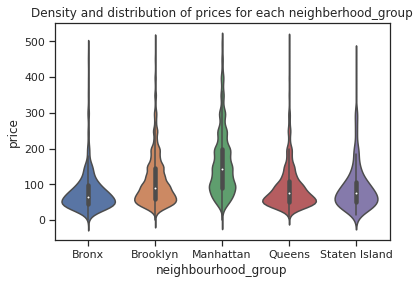

In [33]:
# podemos hacer una visualizacion eliminando los datos extremos.

#creamos a sub-dataframe con valores no extremos / menos que 500
sub_df=df_airbnb[df_airbnb.price < 500]
#using violinplot to showcase density and distribtuion of prices 
viz_2=sns.violinplot(data=sub_df, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')

##### podemos afirmar que Manhattan tiene el rango de precios más alto para los listados con un precio promedio de $150, seguido de Brooklyn con $90 por noche. Queens y Staten Island parecen tener distribuciones muy similares, Bronx es el más barato de todos. 

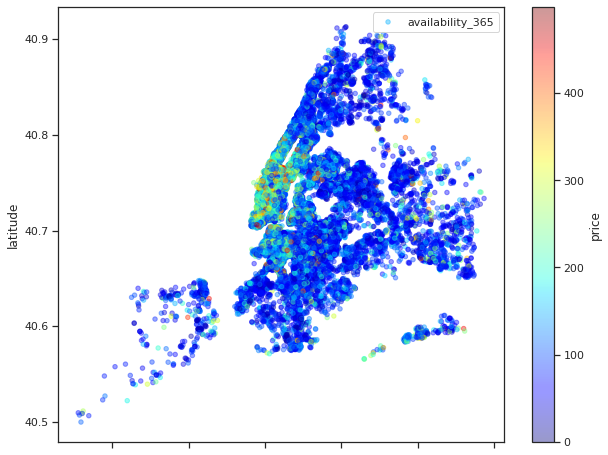

In [34]:
# ahora aplicamos longitud y latitud 

# diagrama de dispersión
# usando para precios menores de 500 vemos las disponibilidades
viz_4=sub_df.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price',
                  cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, figsize=(10,8))
viz_4.legend()

##### El diagrama de dispersión funcionó bien para mostrar nuestros puntos de latitud y longitud. Sin embargo, sería bueno tener un mapa de calor. 

In [64]:
fig=px.scatter_mapbox(df_airbnb, lat='latitude', lon='longitude', mapbox_style='open-street-map', width=700, height=700)
fig.show()


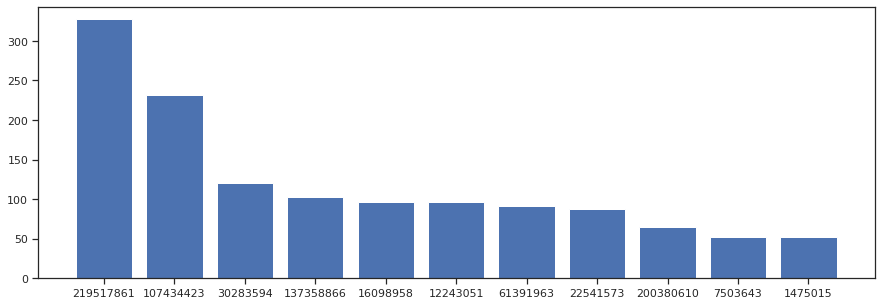

In [35]:
histogramas_de_host_aux = df_airbnb['host_id'].value_counts()

histogramas_de_host = pd.DataFrame(histogramas_de_host_aux.values, columns=['frecuencia'])
histogramas_de_host['host_id']=histogramas_de_host_aux.index

fig=plt.figure(figsize=(15,5))
histogramas_de_host_aux2 =histogramas_de_host[histogramas_de_host['frecuencia'] > 50]

plt.bar(histogramas_de_host_aux2['host_id'].astype(str),histogramas_de_host_aux2['frecuencia'])
plt.show()

# cantidad de veces que aparce el host id, el host que tiene mas alquileres en alguna de sus propiedades.

##### Interesante, podemos ver que hay una buena distribución entre los 10 principales hosts con la mayor cantidad de listados. El primero tiene más de 300 listados.

In [36]:
# sacar los precios 0 porque me puede distorcionar la media.
np.sum(df_airbnb['price']==0)

11

In [37]:
# saque los precios en 0 
df=df_airbnb[df_airbnb['price']!=0]

In [38]:
np.sum(df['price']==0)

0

In [39]:
round(df.describe()) # no fue interesante el analisis dado que me dio el mismo promedio al ser la cantidad muy baja de las propiedades que tenían precio 0 (solo 11).

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48884.0,48884.0,48884.0,48884.0,48884.0,48884.0,48884.0,38833.0,48884.0,48884.0
mean,19016793.0,67622035.0,41.0,-74.0,153.0,7.0,23.0,1.0,7.0,113.0
std,10984315.0,78616662.0,0.0,0.0,240.0,21.0,45.0,2.0,33.0,132.0
min,2539.0,2438.0,40.0,-74.0,10.0,1.0,0.0,0.0,1.0,0.0
25%,9470548.0,7817310.0,41.0,-74.0,69.0,1.0,1.0,0.0,1.0,0.0
50%,19675740.0,30792574.0,41.0,-74.0,106.0,3.0,5.0,1.0,1.0,45.0
75%,29152967.0,107434423.0,41.0,-74.0,175.0,5.0,24.0,2.0,2.0,227.0
max,36487245.0,274321313.0,41.0,-74.0,10000.0,1250.0,629.0,58.0,327.0,365.0


**Análisis del precio promedio por tipo de alojamiento y distrito**

In [44]:
# precio promedio por tipo de alojamineto y distrito 
df_precio_promedio = df_airbnb.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
print("Precio promedio por tipo de alojamiento y distrito:")
pd.DataFrame(df_precio_promedio).sort_values(by=['room_type', 'price'])

Precio promedio por tipo de alojamiento y distrito:


price
room_type       neighbourhood_group            
Entire home/apt Bronx                127.506596
                Queens               147.050573
                Staten Island        173.846591
                Brooklyn             178.346202
                Manhattan            249.257994
Private room    Staten Island         62.292553
                Bronx                 66.890937
                Queens                71.762456
                Brooklyn              76.545428
                Manhattan            116.776622
Shared room     Brooklyn              50.773723
                Staten Island         57.444444
                Bronx                 59.800000
                Queens                69.020202
                Manhattan             88.977083

In [42]:
# precio promedio por barrio:
df_airbnb_N=(df_airbnb[['price','neighbourhood_group','longitude','latitude']].groupby(['neighbourhood_group']).mean())
df_airbnb_N

,price,longitude,latitude
neighbourhood_group,,,
Bronx,87.558104,-73.884552,40.848305
Brooklyn,124.419974,-73.951190,40.685036
Manhattan,196.887321,-73.974607,40.765062
Queens,99.517649,-73.872775,40.731531
Staten Island,114.812332,-74.105805,40.610225


In [42]:
df_airbnb_N

,price,longitude,latitude
neighbourhood_group,,,
Bronx,87.496792,-73.884552,40.848305
Brooklyn,124.383207,-73.951190,40.685036
Manhattan,196.875814,-73.974607,40.765062
Queens,99.517649,-73.872775,40.731531
Staten Island,114.812332,-74.105805,40.610225


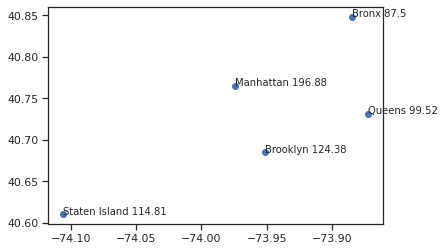

In [43]:
# graficar los precios promedios:
fig=plt.figure()
plt.plot(df_airbnb_N['longitude'],df_airbnb_N['latitude'],"o")
for i in range (len(df_airbnb_N)):
    texto = df_airbnb_N.index[i] +  " " + str(np.round(df_airbnb_N['price'].iloc[ i ],2))
    x = df_airbnb_N["longitude"].iloc[ i ]
    y = df_airbnb_N["latitude"].iloc[ i ]
    plt.annotate( texto, ( x, y) )

##### podemos observar que los precios promedios más altos estan en Manhattan (filtrando por neighbourhood_group)

**Sustituir precio 0 por un promedio para el tipo de alojamiento y barrio.**

In [36]:
# Obtener el precio promedio (excluyendo los valores nulos) por zona y tipo de alojamiento
df_precio_no_nulo = df_airbnb[df_airbnb['price'] > 0]
df_precio_promedio = df_precio_no_nulo.groupby(['room_type','neighbourhood_group'])['price'].mean().sort_values(ascending=True)
pd.DataFrame(df_precio_promedio).sort_values(by='room_type')
dict_precios_promedio = df_precio_promedio.to_dict()

In [37]:
def precio_nulo_a_promedio(fila):
	if fila['price'] > 0:
		return fila['price']
	else:
		return dict_precios_promedio[fila['room_type'], fila['neighbourhood_group']]

In [38]:
df_airbnb['price'] = df_airbnb.apply(precio_nulo_a_promedio, axis=1)

**Boxplot de precios**

In [39]:
fig = px.box(df_airbnb, x='price')
fig.show()

#### Hay muchos valores juntos en los precios más bajos, cuando vamos hacia los precios más altos hay muchos menos datos de precios atipicos. Quiero decir que tenemos pocas propiedades con precios atípicos.

**Histograma de precios** (sin considerar outliers)

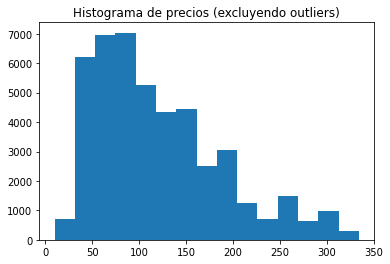

In [41]:
q1_pr = df_airbnb['price'].quantile(0.25)
q3_pr = df_airbnb['price'].quantile(0.75)
IQR_pr = q3_pr - q1_pr
min_pr = q1_pr - 1.5*IQR_pr
max_pr = q3_pr + 1.5*IQR_pr
df_sin_outliers_precio = df_airbnb[(df_airbnb['price']>=min_pr) & (df_airbnb['price']<=max_pr)]
plt.hist(df_sin_outliers_precio.price, bins=15)
plt.title('Histograma de precios (excluyendo outliers)')
plt.show()

#### Los precios que mas vemos es entre 50 y 100 luego comienza a bajar la cantidad de alojamientos con mayor precio.

**Análisis de reviews**

In [46]:
print(f"Hay {len(df_airbnb.loc[df_airbnb['number_of_reviews']==0])} filas con 0 reviews y {df_airbnb['reviews_per_month'].isna().sum()} filas con nan en reviews por mes")

Hay 10052 filas con 0 reviews y 10052 filas con nan en reviews por mes


##### La cantidad de filas en las cuales hay 0 reviews es igual a la cantidad de filas que tienen nan en reviews por mes.

**Hosts con mayor cantidad de reviews** 

In [47]:
df_reviews = df_airbnb.groupby(['host_id', 'host_name']).agg({'number_of_reviews': np.sum, 'id': pd.Series.nunique}).rename(columns={'number_of_reviews':'total_number_of_reviews', 'id':'propierties'})
print("Top 10 de hosts con mayor cantidad de reviews (entre todas sus propiedades):")
pd.DataFrame(df_reviews).sort_values(by=['total_number_of_reviews'], ascending=False).head(10)

Top 10 de hosts con mayor cantidad de reviews (entre todas sus propiedades):


,,total_number_of_reviews,propierties
host_id,host_name,,
37312959,Maya,2273,5
344035,Brooklyn& Breakfast -Len-,2205,13
26432133,Danielle,2017,5
35524316,Yasu & Akiko,1971,11
40176101,Brady,1818,7
4734398,Jj,1798,3
16677326,Alex And Zeena,1355,12
6885157,Randy,1346,15
219517861,Sonder (NYC),1281,327


**Hosts con mayor cantidad de reviews por mes**

In [48]:
df_reviews_per_month = df_airbnb.groupby(['host_id', 'host_name']).agg({'reviews_per_month': np.sum, 'id': pd.Series.nunique}).rename(columns={'reviews_per_month':'total_number_of_reviews_per_month', 'id':'propierties'})
print("Top 10 de hosts con mayor cantidad de reviews por mes (entre todas sus propiedades):")
pd.DataFrame(df_reviews_per_month).sort_values(by=['total_number_of_reviews_per_month'], ascending=False).head(10)

Top 10 de hosts con mayor cantidad de reviews por mes (entre todas sus propiedades):


,,total_number_of_reviews_per_month,propierties
host_id,host_name,,
219517861,Sonder (NYC),397.56,327
244361589,Row NYC,111.72,9
232251881,Lakshmee,80.63,8
26432133,Danielle,68.02,5
137274917,David,62.89,12
224414117,Gabriel,59.10,30
156948703,Asad,56.44,6
344035,Brooklyn& Breakfast -Len-,56.00,13
156684502,Nalicia,54.38,3


In [50]:
# cantidad de reviews per month por neighbourhood_group:
df_airbnb_N=(df_airbnb[['reviews_per_month','neighbourhood_group','longitude','latitude']].groupby(['neighbourhood_group']).mean())
df_airbnb_N

,reviews_per_month,longitude,latitude
neighbourhood_group,,,
Bronx,1.837831,-73.884552,40.848305
Brooklyn,1.283212,-73.951190,40.685036
Manhattan,1.272131,-73.974607,40.765062
Queens,1.941200,-73.872775,40.731531
Staten Island,1.872580,-74.105805,40.610225


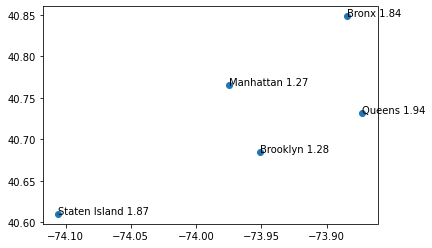

In [51]:
fig=plt.figure()
plt.plot(df_airbnb_N['longitude'],df_airbnb_N['latitude'],"o")
for i in range (len(df_airbnb_N)):
    texto = df_airbnb_N.index[i] +  " " + str(np.round(df_airbnb_N['reviews_per_month'].iloc[ i ],2))
    x = df_airbnb_N["longitude"].iloc[ i ]
    y = df_airbnb_N["latitude"].iloc[ i ]
    plt.annotate( texto, ( x, y) )

##### Aqui podemos observar que las mayores review_per_month la tiene Queens y la menor la tiene Manhattan y Brooklyn. Pomos observar que uno de los neighbourhood_group con mayor precio promedio es el que tiene menor review_per_month.

In [38]:
df_hn=round(df_airbnb.groupby(['host_id','neighbourhood_group'])[['number_of_reviews','id','price']].agg({'id':pd.Series.nunique,'number_of_reviews':['sum','mean'],'price':'mean'}).sort_values(by=('number_of_reviews','mean'),ascending=False))[0:10] # Top 10 host
df_hn


id number_of_reviews         price
                             nunique               sum   mean   mean
host_id  neighbourhood_group                                        
47621202 Queens                  2.0              1205  602.0   47.0
4734398  Manhattan               3.0              1798  599.0   49.0
2369681  Manhattan               1.0               540  540.0   99.0
12949460 Brooklyn                1.0               488  488.0  160.0
792159   Brooklyn                1.0               480  480.0   60.0
37312959 Queens                  5.0              2273  455.0   43.0
2321321  Queens                  1.0               454  454.0   39.0
277379   Manhattan               2.0               897  448.0   72.0
307962   Queens                  1.0               441  441.0   99.0
97086824 Queens                  1.0               434  434.0   49.0

/home/gitpod/.pyenv/versions/3.8.13/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



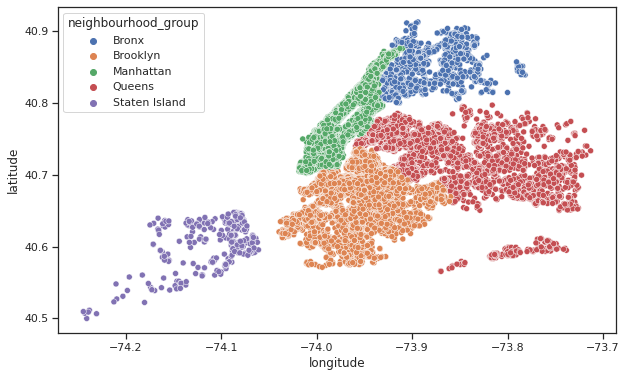

In [39]:
# Map of Neighbourhood group
plt.figure(figsize=(10,6))
sns.scatterplot(df_airbnb.longitude,df_airbnb.latitude,hue=df_airbnb.neighbourhood_group)
plt.ioff()

##### Aqui estamos observando en base a la latitud y longitud las diferentes propiedades por Neighbourhood group.

/home/gitpod/.pyenv/versions/3.8.13/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



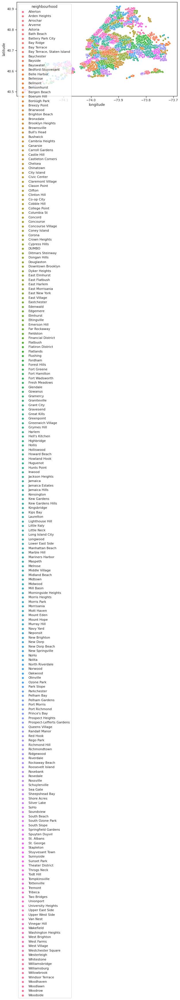

In [52]:
# Map of Neighbourhood
plt.figure(figsize=(10,6))
sns.scatterplot(df_airbnb.longitude,df_airbnb.latitude,hue=df_airbnb.neighbourhood)
plt.ioff()

##### Aqui estamos observando en base a la latitud y longitud las diferentes propiedades por Neighbourhood.

/home/gitpod/.pyenv/versions/3.8.13/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



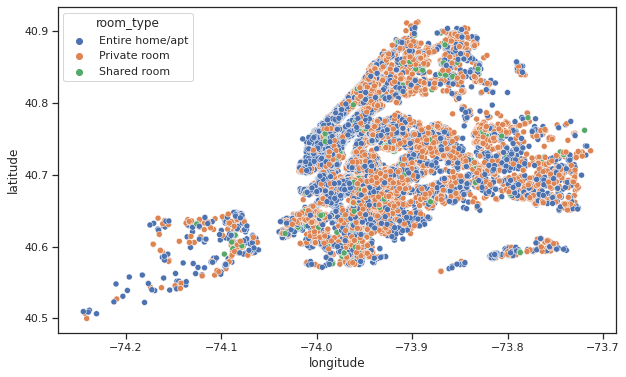

In [53]:
# mostrando los tipos de apartamentos en los diferentes barrios 
plt.figure(figsize=(10,6))
sns.scatterplot(df_airbnb.longitude,df_airbnb.latitude,hue=df_airbnb.room_type)
plt.ioff()


##### aqui podemos observar como prediominan en todos los barrios los Entire home/apt y las private room.
##### Esto sería graficar lo que vimos en porcentajes arriba.